# Loading Necessary Libraries 

In [1]:
!pip install gensim textblob

In [2]:
import pandas as pd
from datetime import datetime

import plotly.express as px
import plotly.graph_objects as go
from wordcloud import WordCloud
import matplotlib.pyplot as plt
import nbformat
import geopandas as gpd
from shapely.geometry import Point

import numpy as np
import statsmodels.api as sm
from statsmodels.formula.api import ols
import scipy.stats as stats
from scipy.stats import pearsonr

import spacy
from sklearn.feature_extraction.text import TfidfVectorizer
import torch
from transformers import AutoTokenizer, BertForSequenceClassification
from gensim import corpora
from gensim.models.ldamodel import LdaModel
from textblob import TextBlob



## Reading In Cleaned Data

In [3]:
data_cleaned = pd.read_csv("../data/raw/cleaned.csv")
data_cleaned

,URL,Rent_Price,Address,Bedrooms,Bathrooms,Parking,Property_Type,Latitude,Longitude,Property_Headline,...,Street_Name,Property_Size,geometry,Distances to CBD,Durations to CBD,SA2_CODE21,SA2_NAME21,AREASQKM21,LOCI_URI21,suburb_geometry
0,https://www.domain.com.au/7-isabella-way-tarne...,500.0,"7 Isabella Way, Tarneit VIC 3029",4,2,2,House,-37.837929,144.653245,Well-presented home with all the bells and whi...,...,Isabella Way,449.800000,POINT (144.6532452 -37.8379288),31.04749,40.374833,213051583,Tarneit - Central,7.9607,http://linked.data.gov.au/dataset/asgsed3/SA2/...,POLYGON ((144.6523178479315 -37.83944528652476...
1,https://www.domain.com.au/1906-570-lygon-stree...,460.0,"1906/570 Lygon Street, Carlton VIC 3053",1,1,0,Apartment / Unit / Flat,-37.793559,144.969056,Modern Living & Convenience in the Heart of Ca...,...,Lygon Street,98.498702,POINT (144.9690564 -37.7935594),3.23413,6.918167,206041117,Carlton,1.8187,http://linked.data.gov.au/dataset/asgsed3/SA2/...,POLYGON ((144.9748830463324 -37.79793898811754...
2,https://www.domain.com.au/5-modra-street-point...,550.0,"5 Modra Street, Point Cook VIC 3030",4,2,2,House,-37.905707,144.773112,Close to everything!,...,Modra Street,219.853182,POINT (144.7731119 -37.9057069),29.66289,37.574833,213051464,Point Cook - East,19.0354,http://linked.data.gov.au/dataset/asgsed3/SA2/...,POLYGON ((144.7534775437447 -37.90070077370988...
3,https://www.domain.com.au/5-63-droop-street-fo...,560.0,"5/63 Droop street, Footscray VIC 3011",2,1,1,Apartment / Unit / Flat,-37.796075,144.895730,Great Unit,...,Droop street,98.498702,POINT (144.8957304 -37.79607499999999),7.74954,15.563000,213031348,Footscray,4.9671,http://linked.data.gov.au/dataset/asgsed3/SA2/...,POLYGON ((144.8831003432733 -37.78858527179909...
4,https://www.domain.com.au/104-193-buckley-stre...,530.0,"104/193 Buckley Street, Essendon VIC 3040",2,1,1,Apartment / Unit / Flat,-37.756341,144.909078,"Two bedroom apartment, unit, townhouse & wareh...",...,Buckley Street,98.498702,POINT (144.9090784 -37.7563413),9.51315,18.183500,206031502,Essendon - East,3.5543,http://linked.data.gov.au/dataset/asgsed3/SA2/...,POLYGON ((144.9097019431684 -37.74685583335111...
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
12387,https://www.domain.com.au/21-hannah-street-ben...,155.0,"21 Hannah Street, Benalla VIC 3672",0,0,0,House,-36.543437,145.984015,STORAGE SHEDS AVAILABLE - 21 HANNAH STREET,...,Hannah Street,219.853182,POINT (145.9840153 -36.5434371),202.65797,146.344333,204021063,Benalla,315.3043,http://linked.data.gov.au/dataset/asgsed3/SA2/...,POLYGON ((145.9175239231474 -36.55746990654701...
12388,https://www.domain.com.au/34-yosemite-street-t...,530.0,"34 Yosemite Street, Truganina VIC 3029",4,2,2,House,-37.759074,144.696542,Home in the heart of Truganina.,...,Yosemite Street,219.853182,POINT (144.696542 -37.7590745),32.85126,33.444667,213041359,Rockbank - Mount Cottrell,125.7609,http://linked.data.gov.au/dataset/asgsed3/SA2/...,POLYGON ((144.6179810465789 -37.72021265348595...
12389,https://www.domain.com.au/39-kenny-street-west...,550.0,"39 Kenny Street, Westmeadows VIC 3049",4,2,2,House,-37.676119,144.900169,FOUR BEDROOM HOME,...,Kenny Street,219.853182,POINT (144.9001691 -37.6761187),18.21199,29.988833,210051245,Gladstone Park - Westmeadows,13.9360,http://linked.data.gov.au/dataset/asgsed3/SA2/...,POLYGON ((144.8715228168004 -37.68171008034838...
12390,https://www.domain.com.au/311-1728-dandenong-r...,550.0,"311/1728 Dandenong Road, Clayton VIC 3168",2,1,0,Apartment / Unit / Flat,-37.913004,145.124261,KUSP Apartments - Student Accommodation Clayton,...,Dandenong Road,98.498702,POINT (145.124261 -37.9130043),23.21435,27.690667,212051567,Clayton (North) - Notting Hill,5.2293,http://linked.data.gov.au/dataset/asgsed3/SA2/...,POLYGON ((145.1232019286827 -37.90657123898076...


In [4]:
data_cleaned.columns

Index(['URL', 'Rent_Price', 'Address', 'Bedrooms', 'Bathrooms', 'Parking',
       'Property_Type', 'Latitude', 'Longitude', 'Property_Headline',
       'Property_Description', 'Extra_Features', 'Date_Available', 'Bond',
       'Internal_Area', 'Land_Area', 'Street', 'Suburb', 'Postcode',
       'Availability', 'Street_Name', 'Property_Size', 'geometry',
       'Distances to CBD', 'Durations to CBD', 'SA2_CODE21', 'SA2_NAME21',
       'AREASQKM21', 'LOCI_URI21', 'suburb_geometry'],
      dtype='object')

In [5]:
len(data_cleaned["SA2_CODE21"].unique())

411

# Analysis

## Distances

In [6]:
bins = [0, 5, 10, 15, 20, 30, 50, 100] 
bin_labels = ['0-5 km', '5-10 km', '10-15 km', '15-20 km', '20-30 km', '30-50 km', '50+ km']
data_cleaned['Distance_Bin'] = pd.cut(data_cleaned['Distances to CBD'], bins=bins, labels=bin_labels, include_lowest=True)
avg_rent_by_distance = data_cleaned.groupby('Distance_Bin')['Rent_Price'].mean().reset_index()

/var/folders/ly/fm0kkb6x1b91l8mnvhcy7kg00000gn/T/ipykernel_39673/67021495.py:4: FutureWarning: The default of observed=False is deprecated and will be changed to True in a future version of pandas. Pass observed=False to retain current behavior or observed=True to adopt the future default and silence this warning.
  avg_rent_by_distance = data_cleaned.groupby('Distance_Bin')['Rent_Price'].mean().reset_index()


In [7]:
fig = px.bar(avg_rent_by_distance, x="Distance_Bin", y="Rent_Price", title="Average Rent Price by Distance from CBD",
             labels={'Distance_Bin': 'Distance from CBD', 'Rent_Price': 'Average Rent Price'},
             color="Distance_Bin")

fig.add_trace(
    go.Scatter(
        x=avg_rent_by_distance['Distance_Bin'],
        y=avg_rent_by_distance['Rent_Price'],
        mode='lines+markers',
        name='Trend Line',
        line=dict(color='black', width=2),
        marker=dict(size=8)
    )
)

fig.show()

/Users/tinas/anaconda3/envs/garyenv/lib/python3.11/site-packages/plotly/express/_core.py:1958: FutureWarning: The default of observed=False is deprecated and will be changed to True in a future version of pandas. Pass observed=False to retain current behavior or observed=True to adopt the future default and silence this warning.
  grouped = df.groupby(required_grouper, sort=False)  # skip one_group groupers
/Users/tinas/anaconda3/envs/garyenv/lib/python3.11/site-packages/plotly/express/_core.py:1979: FutureWarning: When grouping with a length-1 list-like, you will need to pass a length-1 tuple to get_group in a future version of pandas. Pass `(name,)` instead of `name` to silence this warning.
  sf: grouped.get_group(s if len(s) > 1 else s[0])


In [8]:
dist_correlation, dist_p_value = pearsonr(data_cleaned['Distances to CBD'], data_cleaned['Rent_Price'])

print(f"Correlation between distance and rental price: {dist_correlation:.4f}")
print(f"P-value for the correlation: {dist_p_value}")


Correlation between distance and rental price: -0.2324
P-value for the correlation: 1.1950694857319414e-151


#### Conclusion for Distance and Rent
**The correlation between distance from the CBD and rental price is -0.2448, showing a weak negative relationship. The extremely low p-value (6.08e-160) indicates this relationship is statistically significant.**

## Duration

In [9]:
print("Min duration", min(data_cleaned['Durations to CBD']), "Max duration", max(data_cleaned['Durations to CBD']))

Min duration 0.0031666666666666 Max duration 383.9088333333333


In [10]:
px.scatter(data_cleaned, x="Durations to CBD", y="Rent_Price")

In [11]:
min_duration = data_cleaned['Durations to CBD'].min()
max_duration = data_cleaned['Durations to CBD'].max()
bin_size = 20
bins = list(range(int(min_duration), int(max_duration) + bin_size, bin_size)) 
bin_labels = [f'{i}-{i + bin_size} min' for i in bins[:-1]]  

data_cleaned['Duration_Bin'] = pd.cut(data_cleaned['Durations to CBD'], bins=bins, labels=bin_labels, include_lowest=True)
avg_rent_by_duration = data_cleaned.groupby('Duration_Bin')['Rent_Price'].mean().reset_index()

print(avg_rent_by_duration)

   Duration_Bin  Rent_Price
0      0-20 min  609.317501
1     20-40 min  576.222802
2     40-60 min  548.850613
3     60-80 min  516.025097
4    80-100 min  465.469163
5   100-120 min  474.685535
6   120-140 min  476.108374
7   140-160 min  527.500000
8   160-180 min  401.176471
9   180-200 min  487.250000
10  200-220 min  426.808511
11  220-240 min  539.074074
12  240-260 min  456.000000
13  260-280 min  458.571429
14  280-300 min         NaN
15  300-320 min         NaN
16  320-340 min         NaN
17  340-360 min         NaN
18  360-380 min  470.875000
19  380-400 min  484.791667


/var/folders/ly/fm0kkb6x1b91l8mnvhcy7kg00000gn/T/ipykernel_39673/1278188927.py:8: FutureWarning:

The default of observed=False is deprecated and will be changed to True in a future version of pandas. Pass observed=False to retain current behavior or observed=True to adopt the future default and silence this warning.



In [12]:
fig = px.bar(avg_rent_by_duration, x="Duration_Bin", y="Rent_Price", title="Average Rent Price by Duration from CBD",
             labels={'Duration_Bin': 'Duration from CBD', 'Rent_Price': 'Average Rent Price'},
             color="Duration_Bin")

fig.add_trace(
    go.Scatter(
        x=avg_rent_by_duration['Duration_Bin'],
        y=avg_rent_by_duration['Rent_Price'],
        mode='lines+markers',
        name='Trend Line',
        line=dict(color='black', width=2),
        marker=dict(size=8)
    )
)

fig.show()

/Users/tinas/anaconda3/envs/garyenv/lib/python3.11/site-packages/plotly/express/_core.py:1958: FutureWarning:

The default of observed=False is deprecated and will be changed to True in a future version of pandas. Pass observed=False to retain current behavior or observed=True to adopt the future default and silence this warning.

/Users/tinas/anaconda3/envs/garyenv/lib/python3.11/site-packages/plotly/express/_core.py:1979: FutureWarning:

When grouping with a length-1 list-like, you will need to pass a length-1 tuple to get_group in a future version of pandas. Pass `(name,)` instead of `name` to silence this warning.



In [13]:
dur_correlation, dur_p_value = pearsonr(data_cleaned['Durations to CBD'], data_cleaned['Rent_Price'])

print(f"Correlation between distance and rental price: {dur_correlation:.4f}")
print(f"P-value for the correlation: {dur_p_value}")


Correlation between distance and rental price: -0.2378
P-value for the correlation: 7.236978212406929e-159


#### Conclusion for Duration and Rent
**The correlation between duration from the CBD and rental price is -0.2505., showing a weak negative relationship. The extremely low p-value (1.04e-167) indicates this relationship is statistically significant.**

## Property Type & Internal Features

### Property Type

In [14]:
property_rent = data_cleaned.groupby("Property_Type")['Rent_Price'].mean().reset_index()
fig = px.bar(property_rent, 
             x="Property_Type", 
             y="Rent_Price", 
             title="Average Rent Price by Property Type",
             labels={'Rent_Price':'Average Rent Price', 'Property_Type':'Property Type'},
             )

fig.update_layout(xaxis_tickangle=-45, 
                  yaxis_title="Average Rent Price (AUD)",
                  xaxis_title="Property Type",
                  title_x=0.5)  
fig.show()

In [15]:
anova_result = stats.f_oneway(*[group['Rent_Price'].values for name, group in data_cleaned.groupby('Property_Type')])
print(anova_result)
if anova_result.pvalue < 0.05:
    print("The differences between property types are statistically significant.")
else:
    print("No significant differences were found between property types.")


F_onewayResult(statistic=113.66254740558854, pvalue=2.2627912014222605e-227)
The differences between property types are statistically significant.


### Bedroom Number

- Distribution of bedrooms number 

In [16]:
fig = px.histogram(data_cleaned, 
             x="Bedrooms", 
             title="Histogram of Number of Bedrooms")
fig.show()

In [17]:
data_cleaned = data_cleaned.loc[data_cleaned["Bedrooms"] < 6]
bedroom_rent = data_cleaned.groupby("Bedrooms")['Rent_Price'].mean().reset_index()

In [18]:
fig = go.Figure()

fig.add_trace(go.Bar(
    x=bedroom_rent['Bedrooms'],
    y=bedroom_rent['Rent_Price'],
    name='Average Rent Price',
    marker_color='lightskyblue'
))

fig.add_trace(go.Scatter(
    x=bedroom_rent['Bedrooms'],
    y=bedroom_rent['Rent_Price'],
    mode='lines+markers',
    name='Trend Line',
    line=dict(color='royalblue', width=3),
    marker=dict(size=8)
))

fig.update_layout(
    title="Average Rent Price by Number of Bedrooms (After Removing Outliers)",
    xaxis_title="Number of Bedrooms",
    yaxis_title="Average Rent Price",
    title_x=0.5,
    template='plotly_white',
    xaxis=dict(
        tickmode='linear',
        tick0=0,
        dtick=1
    ),
    yaxis=dict(
        gridcolor='lightgray'
    ),
    legend=dict(
        x=0.8,
        y=1.1
    )
)

fig.show()

In [19]:
pearson_corr, p_value_pearson = stats.pearsonr(data_cleaned['Bedrooms'].astype(float), data_cleaned['Rent_Price'])
spearman_corr, p_value_spearman = stats.spearmanr(data_cleaned['Bedrooms'].astype(float), data_cleaned['Rent_Price'])
model = ols('Rent_Price ~ C(Bedrooms)', data=data_cleaned).fit()
anova_table = sm.stats.anova_lm(model, typ=2)

print(f"Pearson Correlation: {pearson_corr:.3f}, p-value: {p_value_pearson:.3e}")
if p_value_pearson < 0.05:
    print("There is a statistically significant linear relationship between Bedrooms and Rent Price.")
else:
    print("There is no statistically significant linear relationship between Bedrooms and Rent Price.")

print(f"Spearman Correlation: {spearman_corr:.3f}, p-value: {p_value_spearman:.3e}")
if p_value_spearman < 0.05:
    print("There is a statistically significant monotonic relationship between Bedrooms and Rent Price.")
else:
    print("There is no statistically significant monotonic relationship between Bedrooms and Rent Price.")

print("\nANOVA Table:")
print(anova_table)
if anova_table['PR(>F)'][0] < 0.05:
    print("\nThe number of bedrooms significantly affects the rent price.")
else:
    print("\nThe number of bedrooms does not significantly affect the rent price.")


Pearson Correlation: 0.336, p-value: 9.881e-324
There is a statistically significant linear relationship between Bedrooms and Rent Price.
Spearman Correlation: 0.320, p-value: 3.596e-293
There is a statistically significant monotonic relationship between Bedrooms and Rent Price.

ANOVA Table:
                   sum_sq       df           F  PR(>F)
C(Bedrooms)  4.701608e+07      5.0  536.128126     0.0
Residual     2.166958e+08  12355.0         NaN     NaN

The number of bedrooms significantly affects the rent price.


/var/folders/ly/fm0kkb6x1b91l8mnvhcy7kg00000gn/T/ipykernel_39673/2699523176.py:20: FutureWarning:

Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`



### Bathroom Number

In [20]:
fig = px.histogram(data_cleaned, 
             x="Bathrooms", 
             title="Histogram of Number of Bathrooms")
fig.show()

In [21]:
data_cleaned = data_cleaned.loc[data_cleaned["Bathrooms"] < 6]
bathroom_rent = data_cleaned.groupby("Bathrooms")['Rent_Price'].mean().reset_index()

In [22]:
color_palette = px.colors.qualitative.Plotly

In [23]:
fig = go.Figure()

# Add the bar trace for Average Rent Price by Number of Bathrooms
fig.add_trace(go.Bar(
    x=bathroom_rent['Bathrooms'],
    y=bathroom_rent['Rent_Price'],
    name='Average Rent Price',
    marker_color=color_palette[:len(bathroom_rent)],  # Assign distinct colors from the palette
    text=bathroom_rent['Rent_Price'].round(2),  # Add data labels
    textposition='outside'
))

# Add the scatter trace for the Trend Line
fig.add_trace(go.Scatter(
    x=bathroom_rent['Bathrooms'],
    y=bathroom_rent['Rent_Price'],
    mode='lines+markers',
    name='Trend Line',
    line=dict(color='black', width=3),
    marker=dict(size=10, color='black')  # Keep the trend line distinct with black markers
))

# Update layout to improve aesthetics
fig.update_layout(
    title="Average Rent Price by Number of Bathrooms (After Removing Outliers)",
    xaxis_title="Number of Bathrooms",
    yaxis_title="Average Rent Price (AUD)",
    title_x=0.5,
    template='plotly_white',
    xaxis=dict(
        tickmode='linear',
        tick0=0,
        dtick=1,
        title_standoff=10
    ),
    yaxis=dict(
        gridcolor='lightgray'
    ),
    legend=dict(
        x=0.8,
        y=1.15,
        orientation='h'
    ),
    margin=dict(l=40, r=40, t=60, b=100)
)

# Show the figure
fig.show()

In [24]:
pearson_corr, p_value_pearson = stats.pearsonr(data_cleaned['Bathrooms'].astype(float), data_cleaned['Rent_Price'])
spearman_corr, p_value_spearman = stats.spearmanr(data_cleaned['Bathrooms'].astype(float), data_cleaned['Rent_Price'])
model = ols('Rent_Price ~ C(Bathrooms)', data=data_cleaned).fit()
anova_table = sm.stats.anova_lm(model, typ=2)

print(f"Pearson Correlation: {pearson_corr:.3f}, p-value: {p_value_pearson:.3e}")
if p_value_pearson < 0.05:
    print("There is a statistically significant linear relationship between Bathrooms and Rent Price.")
else:
    print("There is no statistically significant linear relationship between Bathrooms and Rent Price.")

print(f"Spearman Correlation: {spearman_corr:.3f}, p-value: {p_value_spearman:.3e}")
if p_value_spearman < 0.05:
    print("There is a statistically significant monotonic relationship between Bathrooms and Rent Price.")
else:
    print("There is no statistically significant monotonic relationship between Bathrooms and Rent Price.")

print("\nANOVA Table:")
print(anova_table)
if anova_table['PR(>F)'][0] < 0.05:
    print("\nThe number of Bathrooms significantly affects the rent price.")
else:
    print("\nThe number of Bathrooms does not significantly affect the rent price.")


Pearson Correlation: 0.422, p-value: 0.000e+00
There is a statistically significant linear relationship between Bathrooms and Rent Price.
Spearman Correlation: 0.415, p-value: 0.000e+00
There is a statistically significant monotonic relationship between Bathrooms and Rent Price.

ANOVA Table:
                    sum_sq       df          F  PR(>F)
C(Bathrooms)  4.709125e+07      5.0  537.47771     0.0
Residual      2.164447e+08  12352.0        NaN     NaN

The number of Bathrooms significantly affects the rent price.


/var/folders/ly/fm0kkb6x1b91l8mnvhcy7kg00000gn/T/ipykernel_39673/4294856280.py:20: FutureWarning:

Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`



### Parkings

In [25]:
fig = px.histogram(data_cleaned, 
             x="Parking", 
             title="Histogram of Number of Parkings")
fig.show()

In [26]:
data_cleaned = data_cleaned.loc[data_cleaned["Parking"] < 6]
parking_rent = data_cleaned.groupby("Parking")['Rent_Price'].mean().reset_index()

In [27]:
fig = go.Figure()

fig.add_trace(go.Bar(
    x=parking_rent['Parking'],
    y=parking_rent['Rent_Price'],
    name='Average Rent Price',
    marker_color='lightskyblue'
))

fig.add_trace(go.Scatter(
    x=parking_rent['Parking'],
    y=parking_rent['Rent_Price'],
    mode='lines+markers',
    name='Trend Line',
    line=dict(color='royalblue', width=3),
    marker=dict(size=8)
))

fig.update_layout(
    title="Average Rent Price by Number of Parking (After Removing Outliers)",
    xaxis_title="Number of Parking",
    yaxis_title="Average Rent Price",
    title_x=0.5,
    template='plotly_white',
    xaxis=dict(
        tickmode='linear',
        tick0=0,
        dtick=1
    ),
    yaxis=dict(
        gridcolor='lightgray'
    ),
    legend=dict(
        x=0.8,
        y=1.1
    )
)

fig.show()

In [28]:
pearson_corr, p_value_pearson = stats.pearsonr(data_cleaned['Parking'].astype(float), data_cleaned['Rent_Price'])
spearman_corr, p_value_spearman = stats.spearmanr(data_cleaned['Parking'].astype(float), data_cleaned['Rent_Price'])
model = ols('Rent_Price ~ C(Parking)', data=data_cleaned).fit()
anova_table = sm.stats.anova_lm(model, typ=2)

print(f"Pearson Correlation: {pearson_corr:.3f}, p-value: {p_value_pearson:.3e}")
if p_value_pearson < 0.05:
    print("There is a statistically significant linear relationship between Parking and Rent Price.")
else:
    print("There is no statistically significant linear relationship between Parking and Rent Price.")

print(f"Spearman Correlation: {spearman_corr:.3f}, p-value: {p_value_spearman:.3e}")
if p_value_spearman < 0.05:
    print("There is a statistically significant monotonic relationship between Parking and Rent Price.")
else:
    print("There is no statistically significant monotonic relationship between Parking and Rent Price.")

print("\nANOVA Table:")
print(anova_table)
if anova_table['PR(>F)'][0] < 0.05:
    print("\nThe number of Parking significantly affects the rent price.")
else:
    print("\nThe number of Parking does not significantly affect the rent price.")


Pearson Correlation: 0.177, p-value: 1.325e-87
There is a statistically significant linear relationship between Parking and Rent Price.
Spearman Correlation: 0.184, p-value: 8.160e-94
There is a statistically significant monotonic relationship between Parking and Rent Price.

ANOVA Table:
                  sum_sq       df          F        PR(>F)
C(Parking)  9.523781e+06      5.0  93.133733  1.428008e-96
Residual    2.514758e+08  12296.0        NaN           NaN

The number of Parking significantly affects the rent price.


/var/folders/ly/fm0kkb6x1b91l8mnvhcy7kg00000gn/T/ipykernel_39673/2622904410.py:20: FutureWarning:

Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`



#### Public transports

In [29]:
shapefile_path = '../data/landing/SA2_2021_AUST_SHP_GDA2020/SA2_2021_AUST_GDA2020.shp'
gdf = gpd.read_file(shapefile_path)
gdf['STE_NAME21'].unique()
gdf = gdf.loc[gdf['STE_NAME21'] == 'Victoria']
gdf = gdf.rename(columns={'geometry': 'suburb_geometry'})
gdf = gdf.set_geometry('suburb_geometry')

In [30]:
metro_train = pd.read_csv("../data/landing/gtfs/2/stops.txt", sep=',')
metro_train
metro_train['geometry'] = gpd.points_from_xy(metro_train['stop_lon'], metro_train['stop_lat'])

train_stations_gdf = gpd.GeoDataFrame(metro_train, geometry='geometry', crs="EPSG:4326")
gdf = gdf.to_crs(epsg=4326)
train_stations_merge = gpd.sjoin(train_stations_gdf, gdf, how='left', predicate='within')


In [31]:
merged_mt_gdf = train_stations_merge.merge(gdf, on="SA2_CODE21", how="inner", suffixes=('', '_polygon'))
columns_to_keep = list(train_stations_gdf.columns) + ["SA2_CODE21", 'AREASQKM21_polygon', 'suburb_geometry']
merged_mt_gdf = merged_mt_gdf[columns_to_keep]
merged_mt_gdf

,stop_id,stop_name,stop_lat,stop_lon,geometry,SA2_CODE21,AREASQKM21_polygon,suburb_geometry
0,15351,Sunbury Railway Station (Sunbury),-37.579091,144.727319,POINT (144.72732 -37.57909),210041540,41.4496,"POLYGON ((144.70809 -37.58460, 144.70834 -37.5..."
1,15353,Diggers Rest Railway Station (Diggers Rest),-37.627017,144.719922,POINT (144.71992 -37.62702),210041539,51.8922,"POLYGON ((144.63167 -37.58267, 144.63167 -37.5..."
2,19827,Stony Point Railway Station (Crib Point),-38.374235,145.221837,POINT (145.22184 -38.37423),214021379,108.8841,"MULTIPOLYGON (((145.21286 -38.32891, 145.21286..."
3,19828,Crib Point Railway Station (Crib Point),-38.366123,145.204043,POINT (145.20404 -38.36612),214021379,108.8841,"MULTIPOLYGON (((145.21286 -38.32891, 145.21286..."
4,19829,Morradoo Railway Station (Crib Point),-38.354033,145.189602,POINT (145.18960 -38.35403),214021379,108.8841,"MULTIPOLYGON (((145.21286 -38.32891, 145.21286..."
...,...,...,...,...,...,...,...,...
217,49458,East Pakenham Railway Station (Pakenham),-38.084285,145.506314,POINT (145.50631 -38.08428),212011551,30.9414,"POLYGON ((145.48648 -38.07189, 145.48751 -38.0..."
218,52095,Southland Railway Station (Cheltenham),-37.958756,145.049121,POINT (145.04912 -37.95876),208031188,8.7376,"POLYGON ((145.04572 -37.95393, 145.04452 -37.9..."
219,52159,Middle Gorge Railway Station (South Morang),-37.644061,145.092144,POINT (145.09214 -37.64406),209041436,7.7445,"POLYGON ((145.06084 -37.63128, 145.06102 -37.6..."
220,52160,Hawkstowe Railway Station (South Morang),-37.622995,145.097396,POINT (145.09740 -37.62299),209041435,13.7094,"POLYGON ((145.06452 -37.62634, 145.06046 -37.6..."


In [32]:
data_cleaned['geometry'] = data_cleaned.apply(lambda row: Point(row['Longitude'], row['Latitude']), axis=1)
data_cleaned = gpd.GeoDataFrame(data_cleaned, geometry='geometry', crs='EPSG:4326')

In [33]:
data_cleaned_meters = data_cleaned.to_crs(epsg=3112)
train_stations_gdf_meters = train_stations_gdf.to_crs(epsg=3112)

def nearest_station_distance(property_geom, train_stations_gdf_meters):
    distances = train_stations_gdf_meters.geometry.apply(lambda station: property_geom.distance(station))
    return distances.min()

data_cleaned_meters['Distance_to_Nearest_Station_m'] = data_cleaned_meters['geometry'].apply(
    nearest_station_distance, train_stations_gdf_meters=train_stations_gdf_meters
)

data_cleaned['Distance_to_Nearest_Station_km'] = data_cleaned_meters['Distance_to_Nearest_Station_m'] / 1000

print(data_cleaned[['Distance_to_Nearest_Station_km']].head())

   Distance_to_Nearest_Station_km
0                        6.592960
1                        1.915819
2                        4.499587
3                        0.810762
4                        0.631886


In [34]:
min_dist = data_cleaned['Distance_to_Nearest_Station_km'].min()
max_dist = data_cleaned['Distance_to_Nearest_Station_km'].max()

print(f'Min distance: {min_dist}, Max distance: {max_dist}')

bin_size = 10
bins = np.arange(min_dist, max_dist + bin_size, bin_size)

bin_labels = [f'{round(b, 2)}-{round(b + bin_size, 2)} km' for b in bins[:-1]]
data_cleaned['StationDist_Bin'] = pd.cut(data_cleaned['Distance_to_Nearest_Station_km'], 
                                         bins=bins, 
                                         labels=bin_labels, 
                                         include_lowest=True)

print(data_cleaned[['Distance_to_Nearest_Station_km', 'StationDist_Bin']].head())

Min distance: 0.01999821241545357, Max distance: 444.5387178106326
   Distance_to_Nearest_Station_km StationDist_Bin
0                        6.592960   0.02-10.02 km
1                        1.915819   0.02-10.02 km
2                        4.499587   0.02-10.02 km
3                        0.810762   0.02-10.02 km
4                        0.631886   0.02-10.02 km


In [35]:
fig = px.histogram(data_cleaned, 
             x="Distance_to_Nearest_Station_km", 
             title="Histogram of Number of Distance to Station", nbins=30)
fig.show()

In [36]:
import plotly.colors as pcolors
data_cleaned['StationDist_Bin'] = pd.to_numeric(data_cleaned['Distance_to_Nearest_Station_km'], errors='coerce')

# Create new bins for distance categories
bins = [0, 20, 50, float('inf')]
labels = ['<20 km', '20-50 km', '50+ km']
data_cleaned['Distance_Category'] = pd.cut(data_cleaned['StationDist_Bin'], bins=bins, labels=labels)

# Group by the new bins and calculate average rent price
station_dist = data_cleaned.groupby('Distance_Category')['Rent_Price'].mean().reset_index()

# Use the Plotly qualitative color palette
color_palette = pcolors.qualitative.Plotly

# Create the bar and line plot
fig = go.Figure()

# Add the bar trace
fig.add_trace(go.Bar(
    x=station_dist['Distance_Category'],
    y=station_dist['Rent_Price'],
    name='Average Rent Price',
    marker=dict(color=color_palette[:len(station_dist)], line_width=1.5)
))

# Add the trend line trace
fig.add_trace(go.Scatter(
    x=station_dist['Distance_Category'],
    y=station_dist['Rent_Price'],
    mode='lines+markers',
    name='Trend Line',
    line=dict(color='black', width=3),
    marker=dict(size=8)
))

# Update layout
fig.update_layout(
    title="Average Rent Price by Distance to Nearest Station",
    xaxis_title="Distance to Nearest Station",
    yaxis_title="Average Rent Price (AUD)",
    title_x=0.5,
    template='plotly_white',
    xaxis=dict(
        tickmode='linear',
        title_standoff=10
    ),
    yaxis=dict(
        gridcolor='lightgray'
    ),
    legend=dict(
        x=0.8,
        y=1.1,
        orientation='h'
    )
)

fig.show()

/var/folders/ly/fm0kkb6x1b91l8mnvhcy7kg00000gn/T/ipykernel_39673/3552297396.py:10: FutureWarning:

The default of observed=False is deprecated and will be changed to True in a future version of pandas. Pass observed=False to retain current behavior or observed=True to adopt the future default and silence this warning.



In [37]:
station_correlation, station_p_value = pearsonr(data_cleaned['Distance_to_Nearest_Station_km'], data_cleaned['Rent_Price'])

print(f"Correlation between distance to station and rental price: {station_correlation:.4f}")
print(f"P-value for the correlation: {station_p_value}")


Correlation between distance to station and rental price: -0.2037
P-value for the correlation: 2.201083206691446e-115


### Suburbs and locations

In [38]:
data_cleaned.columns

Index(['URL', 'Rent_Price', 'Address', 'Bedrooms', 'Bathrooms', 'Parking',
       'Property_Type', 'Latitude', 'Longitude', 'Property_Headline',
       'Property_Description', 'Extra_Features', 'Date_Available', 'Bond',
       'Internal_Area', 'Land_Area', 'Street', 'Suburb', 'Postcode',
       'Availability', 'Street_Name', 'Property_Size', 'geometry',
       'Distances to CBD', 'Durations to CBD', 'SA2_CODE21', 'SA2_NAME21',
       'AREASQKM21', 'LOCI_URI21', 'suburb_geometry', 'Distance_Bin',
       'Duration_Bin', 'Distance_to_Nearest_Station_km', 'StationDist_Bin',
       'Distance_Category'],
      dtype='object')

In [39]:
data_cleaned_grouped = data_cleaned.groupby(['SA2_NAME21', 'Street_Name'])['Rent_Price'].mean().reset_index()

# Create a dictionary for the top 10 streets per suburb based on the aggregated data
top_10_per_suburb = {}
for suburb in data_cleaned_grouped['SA2_NAME21'].unique():
    top_10_per_suburb[suburb] = data_cleaned_grouped[data_cleaned_grouped['SA2_NAME21'] == suburb]\
        .sort_values(by='Rent_Price', ascending=False).head(10)


In [40]:
fig = go.Figure()

# Add traces for each suburb
for i, (suburb, data) in enumerate(top_10_per_suburb.items()):
    fig.add_trace(go.Bar(
        x=data['Street_Name'],
        y=data['Rent_Price'],
        name=suburb,
        visible=(i == 0),  # Only the first suburb is visible initially
        marker=dict(color='lightskyblue')
    ))

# Create dropdown buttons for each suburb
dropdown_buttons = []
for i, suburb in enumerate(top_10_per_suburb.keys()):
    visible = [False] * len(top_10_per_suburb) 
    visible[i] = True  # Set only the current suburb to visible

    dropdown_buttons.append(dict(
        label=suburb,
        method="update",
        args=[{"visible": visible}, {"title": f"Top 10 Streets in {suburb} by Average Rent Price"}]
    ))

# Update the figure layout
fig.update_layout(
    updatemenus=[
        dict(
            active=0,
            buttons=dropdown_buttons,
            x=-0.1,
            xanchor="left",
            y=1.05,
            yanchor="top"
        )
    ],
    title={
        'text': "Top 10 Streets by Average Rent Price for Each Suburb",
        'y': 0.95,
        'x': 0.5,
        'xanchor': 'center',
        'yanchor': 'top'
    },
    xaxis_title="Street Name",
    yaxis_title="Average Rent Price",
    template='plotly_white',
    title_x=0.5,
    height=600,
    width=1000,
    xaxis_tickangle=-45,
    margin=dict(l=50, r=50, t=100, b=150),
    barmode='group'  # Set barmode to 'group' to ensure bars are side-by-side
)

# Update traces to ensure they do not stack
fig.update_traces(
    hovertemplate='Street: %{x}<br>Rent Price: %{y}<extra></extra>',
    marker_line=dict(width=1.5, color='DarkSlateGrey')
)

# Show the figure
fig.show()


In [41]:
anova_result = stats.f_oneway(*[group['Rent_Price'].values for name, group in data_cleaned.groupby('SA2_NAME21')])
print(anova_result)
if anova_result.pvalue < 0.05:
    print("The differences between property types are statistically significant.")
else:
    print("No significant differences were found between property types.")


F_onewayResult(statistic=11.754103680893923, pvalue=0.0)
The differences between property types are statistically significant.


In [42]:
anova_result = stats.f_oneway(*[group['Rent_Price'].values for name, group in data_cleaned.groupby('Street_Name')])
print(anova_result)
if anova_result.pvalue < 0.05:
    print("The differences between property types are statistically significant.")
else:
    print("No significant differences were found between property types.")


F_onewayResult(statistic=1.3821109376572271, pvalue=1.1429523008615588e-36)
The differences between property types are statistically significant.


## Others:

In [43]:
data_cleaned.columns

Index(['URL', 'Rent_Price', 'Address', 'Bedrooms', 'Bathrooms', 'Parking',
       'Property_Type', 'Latitude', 'Longitude', 'Property_Headline',
       'Property_Description', 'Extra_Features', 'Date_Available', 'Bond',
       'Internal_Area', 'Land_Area', 'Street', 'Suburb', 'Postcode',
       'Availability', 'Street_Name', 'Property_Size', 'geometry',
       'Distances to CBD', 'Durations to CBD', 'SA2_CODE21', 'SA2_NAME21',
       'AREASQKM21', 'LOCI_URI21', 'suburb_geometry', 'Distance_Bin',
       'Duration_Bin', 'Distance_to_Nearest_Station_km', 'StationDist_Bin',
       'Distance_Category'],
      dtype='object')

#### Extra Ameneties

In [44]:
data_cleaned['Extra_Features'] = data_cleaned['Extra_Features'].fillna('')
data_cleaned['Feature_Count'] = data_cleaned['Extra_Features'].apply(lambda x: len(x.split(', ')) if x else 0)


In [45]:
data_cleaned = data_cleaned.reset_index()

- Picking 10 most frequently occured amenities in the Extra features, and merge with all data to act as features

In [46]:
temp = data_cleaned[["Extra_Features"]].copy()
temp['Amenities_List'] = temp['Extra_Features'].apply(lambda x: x.split(', ') if pd.notna(x) and x else [])

all_amenities = set(amenity for amenities in temp['Amenities_List'] for amenity in amenities)

for amenity in all_amenities:
    temp[amenity] = temp['Amenities_List'].apply(lambda x: 1 if amenity in x else 0)
amenity_counts = temp.iloc[:, 2:].sum().sort_values(ascending=False)

top_10_amenities = amenity_counts.head(10).index

temp_top_10 = temp[top_10_amenities].copy()

temp_top_10 = temp_top_10.reset_index()

/var/folders/ly/fm0kkb6x1b91l8mnvhcy7kg00000gn/T/ipykernel_39673/1859131078.py:7: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`

/var/folders/ly/fm0kkb6x1b91l8mnvhcy7kg00000gn/T/ipykernel_39673/1859131078.py:7: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`

/var/folders/ly/fm0kkb6x1b91l8mnvhcy7kg00000gn/T/ipykernel_39673/1859131078.py:7: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.co

In [47]:
data_all = data_cleaned.copy().drop("index", axis=1)
temp_top_10 = temp_top_10.drop("index", axis=1)
data_all = pd.concat([data_all, temp_top_10],axis=1)
data_all


,URL,Rent_Price,Address,Bedrooms,Bathrooms,Parking,Property_Type,Latitude,Longitude,Property_Headline,...,Built in wardrobes,Dishwasher,Air conditioning,Floorboards,Secure Parking,Intercom,Heating,Ensuite,Balcony / Deck,Fully fenced
0,https://www.domain.com.au/7-isabella-way-tarne...,500.0,"7 Isabella Way, Tarneit VIC 3029",4,2,2,House,-37.837929,144.653245,Well-presented home with all the bells and whi...,...,0,0,0,0,0,0,0,0,0,0
1,https://www.domain.com.au/1906-570-lygon-stree...,460.0,"1906/570 Lygon Street, Carlton VIC 3053",1,1,0,Apartment / Unit / Flat,-37.793559,144.969056,Modern Living & Convenience in the Heart of Ca...,...,0,1,0,0,0,0,0,0,0,0
2,https://www.domain.com.au/5-modra-street-point...,550.0,"5 Modra Street, Point Cook VIC 3030",4,2,2,House,-37.905707,144.773112,Close to everything!,...,0,0,0,0,0,0,0,0,0,0
3,https://www.domain.com.au/5-63-droop-street-fo...,560.0,"5/63 Droop street, Footscray VIC 3011",2,1,1,Apartment / Unit / Flat,-37.796075,144.895730,Great Unit,...,0,0,0,0,0,0,0,0,0,0
4,https://www.domain.com.au/104-193-buckley-stre...,530.0,"104/193 Buckley Street, Essendon VIC 3040",2,1,1,Apartment / Unit / Flat,-37.756341,144.909078,"Two bedroom apartment, unit, townhouse & wareh...",...,0,0,0,0,0,0,0,0,0,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
12297,https://www.domain.com.au/21-hannah-street-ben...,155.0,"21 Hannah Street, Benalla VIC 3672",0,0,0,House,-36.543437,145.984015,STORAGE SHEDS AVAILABLE - 21 HANNAH STREET,...,0,0,0,0,0,0,0,0,0,0
12298,https://www.domain.com.au/34-yosemite-street-t...,530.0,"34 Yosemite Street, Truganina VIC 3029",4,2,2,House,-37.759074,144.696542,Home in the heart of Truganina.,...,0,0,0,0,0,0,0,0,0,0
12299,https://www.domain.com.au/39-kenny-street-west...,550.0,"39 Kenny Street, Westmeadows VIC 3049",4,2,2,House,-37.676119,144.900169,FOUR BEDROOM HOME,...,0,0,0,0,0,0,0,0,0,0
12300,https://www.domain.com.au/311-1728-dandenong-r...,550.0,"311/1728 Dandenong Road, Clayton VIC 3168",2,1,0,Apartment / Unit / Flat,-37.913004,145.124261,KUSP Apartments - Student Accommodation Clayton,...,0,0,0,0,0,0,0,0,0,0


In [48]:
ward = data_all.groupby("Built in wardrobes")["Rent_Price"].mean().reset_index()
fig = px.bar(ward, 
             x='Built in wardrobes', 
             y='Rent_Price', 
             title='Average Rent Price by Presence of Built-in Wardrobes',
             labels={'Built in wardrobes': 'Built-in Wardrobes (1 = Yes, 0 = No)', 'Rent_Price': 'Average Rent Price'})

fig.show()

In [49]:
aircon = data_all.groupby("Air conditioning")["Rent_Price"].mean().reset_index()
fig = px.bar(aircon, 
             x='Air conditioning', 
             y='Rent_Price', 
             title='Average Rent Price by Presence of Airconditioning',
             labels={'Air conditioning': 'Air conditioning (1 = Yes, 0 = No)', 'Rent_Price': 'Average Rent Price'})

fig.show()

In [50]:
anova_result = stats.f_oneway(*[group['Rent_Price'].values for name, group in data_cleaned.groupby('Feature_Count')])
print(f'ANOVA F-statistic: {anova_result.statistic}, p-value: {anova_result.pvalue}')

ANOVA F-statistic: 23.007497796308716, p-value: 4.072978245222256e-126


#### Date Available for Rent

In [51]:
availability = data_cleaned.groupby("Date_Available")['Rent_Price'].mean().reset_index()
fig = px.bar(availability, x="Date_Available", y="Rent_Price", 
             title=" Rent Price by Availability",
             labels={'Rent_Price':'Average Rent Price', 'Date_Available':'Availability'})

fig.show()

In [52]:
anova_result = stats.f_oneway(*[group['Rent_Price'].values for name, group in data_cleaned.groupby('Date_Available')])
print(f'ANOVA F-statistic: {anova_result.statistic}, p-value: {anova_result.pvalue}')

ANOVA F-statistic: 26.21728718573935, p-value: 3.096897898380635e-07


In [53]:
def calculate_days(date_str):
    try:
        return (datetime.strptime(date_str, "%A, %dth %B %Y") - datetime.now()).days
    except ValueError:
        return 0  
    
data_cleaned["Availability_full"] = data_cleaned["Date_Available"].copy()
data_cleaned["Availability_full"] = data_cleaned.apply(
    lambda row: row["Availability"] if row["Date_Available"] == "Later" else row["Date_Available"], axis=1
)

data_cleaned["Days_From_Now"] = data_cleaned["Availability_full"].apply(calculate_days)


In [54]:
days_correlation, days_p_value = pearsonr(data_cleaned['Days_From_Now'], data_cleaned['Rent_Price'])

print(f"Correlation between days needed til available and rental price: {days_correlation:.4f}")
print(f"P-value for the correlation: {days_p_value}")


Correlation between days needed til available and rental price: -0.1229
P-value for the correlation: 1.302850392409201e-42


#### Properties size

In [55]:
fig = px.scatter(data_cleaned, x="Property_Size", y="Rent_Price", color="Property_Type")
fig.show()


/Users/tinas/anaconda3/envs/garyenv/lib/python3.11/site-packages/plotly/express/_core.py:1979: FutureWarning:

When grouping with a length-1 list-like, you will need to pass a length-1 tuple to get_group in a future version of pandas. Pass `(name,)` instead of `name` to silence this warning.



In [56]:
correlation_area = data_cleaned['Internal_Area'].corr(data_cleaned['Rent_Price'])
correlation_land = data_cleaned['Land_Area'].corr(data_cleaned['Rent_Price'])
correlation_gensize = data_cleaned['Property_Size'].corr(data_cleaned['Rent_Price'])
print(correlation_area)
print(correlation_land)
print(correlation_gensize)

-0.15573830274987457
0.20942973189065744
0.04143224643045003


#### Bond / Historical Bond

In [57]:
data_cleaned['Bond'] = data_cleaned['Bond'].str.extract(r'\$([\d,]+)').replace({',': ''}, regex=True)
data_cleaned['Bond'] = pd.to_numeric(data_cleaned['Bond'], errors='coerce')
fig = px.scatter(data_cleaned, x="Bond", y="Rent_Price", color="Property_Type")
fig.show()


/Users/tinas/anaconda3/envs/garyenv/lib/python3.11/site-packages/plotly/express/_core.py:1979: FutureWarning:

When grouping with a length-1 list-like, you will need to pass a length-1 tuple to get_group in a future version of pandas. Pass `(name,)` instead of `name` to silence this warning.



In [58]:
correlation_bond = data_cleaned['Bond'].corr(data_cleaned['Rent_Price'])

print(correlation_bond)

0.24384407232233185


In [59]:
data_cleaned.isna().sum()

index                                 0
URL                                   0
Rent_Price                            0
Address                               0
Bedrooms                              0
Bathrooms                             0
Parking                               0
Property_Type                         0
Latitude                              0
Longitude                             0
Property_Headline                     3
Property_Description                  3
Extra_Features                        0
Date_Available                        0
Bond                                923
Internal_Area                     12162
Land_Area                         11678
Street                               37
Suburb                                1
Postcode                              1
Availability                          0
Street_Name                           0
Property_Size                         0
geometry                              0
Distances to CBD                      0


In [60]:
data_cleaned = data_cleaned.dropna(subset=["Suburb", "Postcode"])

In [61]:
data_cleaned

,index,URL,Rent_Price,Address,Bedrooms,Bathrooms,Parking,Property_Type,Latitude,Longitude,...,LOCI_URI21,suburb_geometry,Distance_Bin,Duration_Bin,Distance_to_Nearest_Station_km,StationDist_Bin,Distance_Category,Feature_Count,Availability_full,Days_From_Now
0,0,https://www.domain.com.au/7-isabella-way-tarne...,500.0,"7 Isabella Way, Tarneit VIC 3029",4,2,2,House,-37.837929,144.653245,...,http://linked.data.gov.au/dataset/asgsed3/SA2/...,POLYGON ((144.6523178479315 -37.83944528652476...,30-50 km,40-60 min,6.592960,6.592960,<20 km,0,"Friday, 18th October 2024",8
1,1,https://www.domain.com.au/1906-570-lygon-stree...,460.0,"1906/570 Lygon Street, Carlton VIC 3053",1,1,0,Apartment / Unit / Flat,-37.793559,144.969056,...,http://linked.data.gov.au/dataset/asgsed3/SA2/...,POLYGON ((144.9748830463324 -37.79793898811754...,0-5 km,0-20 min,1.915819,1.915819,<20 km,3,Available Now,0
2,2,https://www.domain.com.au/5-modra-street-point...,550.0,"5 Modra Street, Point Cook VIC 3030",4,2,2,House,-37.905707,144.773112,...,http://linked.data.gov.au/dataset/asgsed3/SA2/...,POLYGON ((144.7534775437447 -37.90070077370988...,20-30 km,20-40 min,4.499587,4.499587,<20 km,0,Available Now,0
3,3,https://www.domain.com.au/5-63-droop-street-fo...,560.0,"5/63 Droop street, Footscray VIC 3011",2,1,1,Apartment / Unit / Flat,-37.796075,144.895730,...,http://linked.data.gov.au/dataset/asgsed3/SA2/...,POLYGON ((144.8831003432733 -37.78858527179909...,5-10 km,0-20 min,0.810762,0.810762,<20 km,0,Available Now,0
4,4,https://www.domain.com.au/104-193-buckley-stre...,530.0,"104/193 Buckley Street, Essendon VIC 3040",2,1,1,Apartment / Unit / Flat,-37.756341,144.909078,...,http://linked.data.gov.au/dataset/asgsed3/SA2/...,POLYGON ((144.9097019431684 -37.74685583335111...,5-10 km,0-20 min,0.631886,0.631886,<20 km,0,Available Now,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
12297,12387,https://www.domain.com.au/21-hannah-street-ben...,155.0,"21 Hannah Street, Benalla VIC 3672",0,0,0,House,-36.543437,145.984015,...,http://linked.data.gov.au/dataset/asgsed3/SA2/...,POLYGON ((145.9175239231474 -36.55746990654701...,NaN,140-160 min,141.005198,141.005198,50+ km,0,Available Now,0
12298,12388,https://www.domain.com.au/34-yosemite-street-t...,530.0,"34 Yosemite Street, Truganina VIC 3029",4,2,2,House,-37.759074,144.696542,...,http://linked.data.gov.au/dataset/asgsed3/SA2/...,POLYGON ((144.6179810465789 -37.72021265348595...,30-50 km,20-40 min,9.232989,9.232989,<20 km,0,Available Now,0
12299,12389,https://www.domain.com.au/39-kenny-street-west...,550.0,"39 Kenny Street, Westmeadows VIC 3049",4,2,2,House,-37.676119,144.900169,...,http://linked.data.gov.au/dataset/asgsed3/SA2/...,POLYGON ((144.8715228168004 -37.68171008034838...,15-20 km,20-40 min,1.889696,1.889696,<20 km,0,Available Now,0
12300,12390,https://www.domain.com.au/311-1728-dandenong-r...,550.0,"311/1728 Dandenong Road, Clayton VIC 3168",2,1,0,Apartment / Unit / Flat,-37.913004,145.124261,...,http://linked.data.gov.au/dataset/asgsed3/SA2/...,POLYGON ((145.1232019286827 -37.90657123898076...,20-30 km,20-40 min,1.345140,1.345140,<20 km,0,"Friday, 1st November 2024",0


## LLM (Header line & Description)

In [62]:
data_llm = data_cleaned.copy()

In [63]:
data_llm.columns

Index(['index', 'URL', 'Rent_Price', 'Address', 'Bedrooms', 'Bathrooms',
       'Parking', 'Property_Type', 'Latitude', 'Longitude',
       'Property_Headline', 'Property_Description', 'Extra_Features',
       'Date_Available', 'Bond', 'Internal_Area', 'Land_Area', 'Street',
       'Suburb', 'Postcode', 'Availability', 'Street_Name', 'Property_Size',
       'geometry', 'Distances to CBD', 'Durations to CBD', 'SA2_CODE21',
       'SA2_NAME21', 'AREASQKM21', 'LOCI_URI21', 'suburb_geometry',
       'Distance_Bin', 'Duration_Bin', 'Distance_to_Nearest_Station_km',
       'StationDist_Bin', 'Distance_Category', 'Feature_Count',
       'Availability_full', 'Days_From_Now'],
      dtype='object')

## Preprocessing headlines and property descriptions text

In [64]:
!python -m spacy download en_core_web_sm

  Using cached https://github.com/explosion/spacy-models/releases/download/en_core_web_sm-3.7.1/en_core_web_sm-3.7.1-py3-none-any.whl (12.8 MB)
✔ Download and installation successful
You can now load the package via spacy.load('en_core_web_sm')


In [67]:
nlp = spacy.load("en_core_web_sm")


In [68]:
def clean_and_tokenize_spacy(description):
    doc = nlp(description.lower()) 
    print(description)
    tokens = [token.text for token in doc if not token.is_stop and token.is_alpha]
    
    return tokens
data_cleaned['Property_Description'] = data_cleaned['Property_Description'].astype(str)
data_cleaned['Cleaned_Tokens'] = data_cleaned['Property_Description'].apply(clean_and_tokenize_spacy)

print(data_cleaned[['Property_Description', 'Cleaned_Tokens']].head())

Ray White Tarneit proudly presents you 7 Isabella Way, Tarneit for lease. This well maintained beautiful home is in a quiet location in the heart of Moorokyle Estate. Comprising four bedrooms, two bathrooms and generous living space, it's an ideal choice all around. This property has the following features:* Master bedroom with Walk-in Robe and Ensuite* Three other bedrooms with built-in robes
*** Rent will increase to $480.00 Per Week starting from 1st of December 2024. **** Discover the epitome of urban living in this inviting one bedroom apartment, nestled in the vibrant heart of Carlton's Lygon Street precinct. This gem stands out with its modern comforts and bespoke amenities, tailored for those who seek convenience without compromising on quality. It provides easy access to the
VICPROP is proud to present to you this spacious family home positioned in Point Cook. Well located, close proximity to St Mary of the Cross Primary School, Sanctuary Lakes Shopping Centre, public transpor

In [69]:
df = px.data.tips()
fig = px.box(data_cleaned, y="Rent_Price", points="all")
fig.show()

In [70]:
Q1 = data_cleaned['Rent_Price'].quantile(0.25)
Q3 = data_cleaned['Rent_Price'].quantile(0.75)

In [71]:
expensive = data_cleaned.loc[data_cleaned['Rent_Price'] >= Q3]
expensive.head(5)

,index,URL,Rent_Price,Address,Bedrooms,Bathrooms,Parking,Property_Type,Latitude,Longitude,...,suburb_geometry,Distance_Bin,Duration_Bin,Distance_to_Nearest_Station_km,StationDist_Bin,Distance_Category,Feature_Count,Availability_full,Days_From_Now,Cleaned_Tokens
8,8,https://www.domain.com.au/7-marrbridge-road-mo...,750.0,"7 Marrbridge Road, Moorabbin VIC 3189",4,2,2,House,-37.941937,145.058876,...,POLYGON ((145.0364509302993 -37.93846284320676...,20-30 km,20-40 min,1.669346,1.669346,<20 km,0,Available Now,0,"[beautiful, home, boasts, spacious, bedrooms, ..."
10,10,https://www.domain.com.au/1-99-donald-street-b...,650.0,"1/99 Donald Street, Brunswick VIC 3056",3,1,2,Apartment / Unit / Flat,-37.758270,144.971643,...,POLYGON ((144.9503119849172 -37.75808221619089...,5-10 km,0-20 min,0.967240,0.967240,<20 km,4,"Saturday, 12th October 2024",2,"[property, comprises, bedrooms, built, robes, ..."
14,14,https://www.domain.com.au/706-261-bridge-rd-ri...,950.0,"706/261 Bridge Rd, Richmond VIC 3121",2,2,0,Apartment / Unit / Flat,-37.816836,144.998790,...,POLYGON ((144.9908051019467 -37.81286206929964...,0-5 km,0-20 min,0.685577,0.685577,<20 km,14,Available Now,0,"[home, richmond, stylish, urban, playground, o..."
20,20,https://www.domain.com.au/102-469-riversdale-r...,750.0,"102/469 Riversdale Road, Hawthorn East VIC 3123",2,2,1,Apartment / Unit / Flat,-37.831054,145.055491,...,POLYGON ((145.0443494312012 -37.82615883305381...,10-15 km,0-20 min,0.575719,0.575719,<20 km,0,"Tuesday, 22nd October 2024",0,"[brand, new, bedroom, apartment, delivers, hig..."
21,21,https://www.domain.com.au/82-positano-circuit-...,660.0,"82 Positano Circuit, Berwick VIC 3806",4,3,1,House,-38.077736,145.372868,...,"POLYGON ((145.339707494705 -38.05276478492233,...",50+ km,40-60 min,3.065437,3.065437,<20 km,0,Available Now,0,"[located, popular, convenient, minta, estate, ..."


## Wordcloud
Finding common words in expensive properties vs cheaper ones

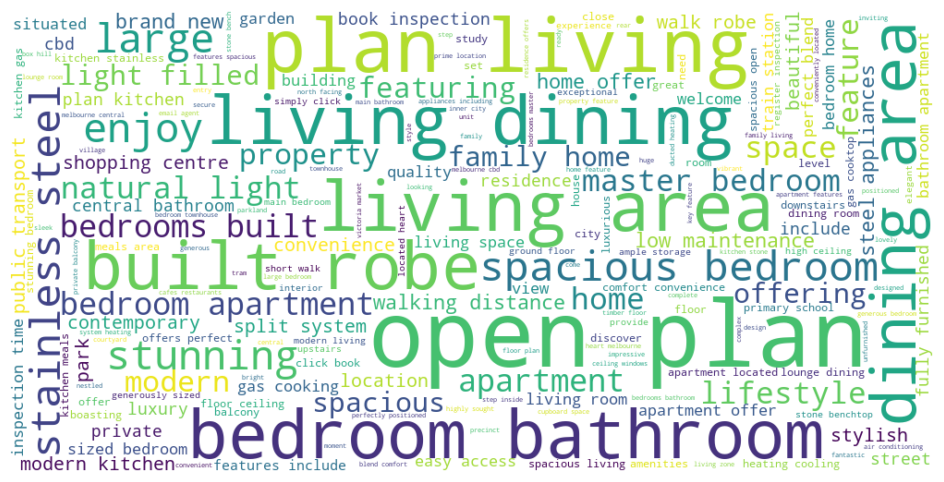

In [72]:
all_words = ' '.join([' '.join(tokens) for tokens in expensive['Cleaned_Tokens']])
wordcloud = WordCloud(
    width=1000, height=500, 
    background_color='white', 
    max_words=200, 
    max_font_size=100, 
).generate(all_words)

plt.figure(figsize=(12, 6))
plt.imshow(wordcloud, interpolation='bilinear')
plt.axis('off') 
plt.show()

In [73]:
cheap = data_cleaned.loc[data_cleaned['Rent_Price'] <= Q3]
cheap.head(5)

,index,URL,Rent_Price,Address,Bedrooms,Bathrooms,Parking,Property_Type,Latitude,Longitude,...,suburb_geometry,Distance_Bin,Duration_Bin,Distance_to_Nearest_Station_km,StationDist_Bin,Distance_Category,Feature_Count,Availability_full,Days_From_Now,Cleaned_Tokens
0,0,https://www.domain.com.au/7-isabella-way-tarne...,500.0,"7 Isabella Way, Tarneit VIC 3029",4,2,2,House,-37.837929,144.653245,...,POLYGON ((144.6523178479315 -37.83944528652476...,30-50 km,40-60 min,6.592960,6.592960,<20 km,0,"Friday, 18th October 2024",8,"[ray, white, tarneit, proudly, presents, isabe..."
1,1,https://www.domain.com.au/1906-570-lygon-stree...,460.0,"1906/570 Lygon Street, Carlton VIC 3053",1,1,0,Apartment / Unit / Flat,-37.793559,144.969056,...,POLYGON ((144.9748830463324 -37.79793898811754...,0-5 km,0-20 min,1.915819,1.915819,<20 km,3,Available Now,0,"[rent, increase, week, starting, december, dis..."
2,2,https://www.domain.com.au/5-modra-street-point...,550.0,"5 Modra Street, Point Cook VIC 3030",4,2,2,House,-37.905707,144.773112,...,POLYGON ((144.7534775437447 -37.90070077370988...,20-30 km,20-40 min,4.499587,4.499587,<20 km,0,Available Now,0,"[vicprop, proud, present, spacious, family, ho..."
3,3,https://www.domain.com.au/5-63-droop-street-fo...,560.0,"5/63 Droop street, Footscray VIC 3011",2,1,1,Apartment / Unit / Flat,-37.796075,144.895730,...,POLYGON ((144.8831003432733 -37.78858527179909...,5-10 km,0-20 min,0.810762,0.810762,<20 km,0,Available Now,0,"[refurbished, bedroom, unit, bir, lockup, gara..."
4,4,https://www.domain.com.au/104-193-buckley-stre...,530.0,"104/193 Buckley Street, Essendon VIC 3040",2,1,1,Apartment / Unit / Flat,-37.756341,144.909078,...,POLYGON ((144.9097019431684 -37.74685583335111...,5-10 km,0-20 min,0.631886,0.631886,<20 km,0,Available Now,0,"[week, free, rent, boutique, bedroom, apartmen..."


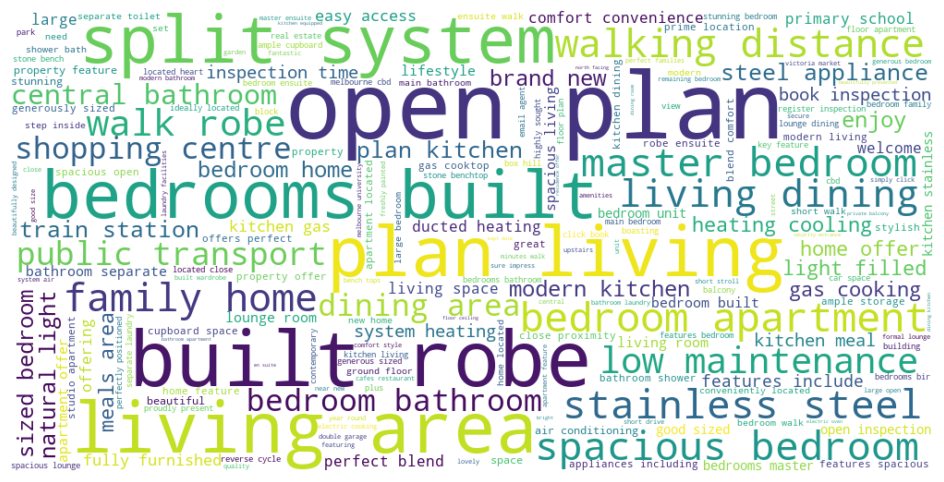

In [74]:
all_cheapwords = ' '.join([' '.join(tokens) for tokens in cheap['Cleaned_Tokens']])
wordcloud = WordCloud(
    width=1000, height=500, 
    background_color='white', 
    max_words=200, 
    max_font_size=100, 
).generate(all_cheapwords)

plt.figure(figsize=(12, 6))
plt.imshow(wordcloud, interpolation='bilinear')
plt.axis('off') 
plt.show()

In [75]:
data_cleaned['Cleaned_Text'] = data_cleaned['Cleaned_Tokens'].apply(lambda x: ' '.join(x))
tfidf = TfidfVectorizer(max_features=500)

tfidf_matrix = tfidf.fit_transform(data_cleaned['Cleaned_Text'])
tfidf_df = pd.DataFrame(tfidf_matrix.toarray(), columns=tfidf.get_feature_names_out())
print(tfidf_df.head())

   abundance    access  accommodation  added  additional  adjoining  agent  \
0        0.0  0.000000            0.0    0.0         0.0        0.0    0.0   
1        0.0  0.178019            0.0    0.0         0.0        0.0    0.0   
2        0.0  0.000000            0.0    0.0         0.0        0.0    0.0   
3        0.0  0.000000            0.0    0.0         0.0        0.0    0.0   
4        0.0  0.000000            0.0    0.0         0.0        0.0    0.0   

   air  airy  alfresco  ...  werribee  west  wide  windows  wir  wyndham  \
0  0.0   0.0       0.0  ...       0.0   0.0   0.0      0.0  0.0      0.0   
1  0.0   0.0       0.0  ...       0.0   0.0   0.0      0.0  0.0      0.0   
2  0.0   0.0       0.0  ...       0.0   0.0   0.0      0.0  0.0      0.0   
3  0.0   0.0       0.0  ...       0.0   0.0   0.0      0.0  0.0      0.0   
4  0.0   0.0       0.0  ...       0.0   0.0   0.0      0.0  0.0      0.0   

   yard  yarra  year  zone  
0   0.0    0.0   0.0   0.0  
1   0.0    0.0  

In [76]:

# Sentiment analysis using textblob for property description
def get_sentiment(text):
    analysis = TextBlob(text)
    return analysis.sentiment.polarity
data_cleaned['Sentiment'] = data_cleaned['Cleaned_Text'].apply(get_sentiment)

print(data_cleaned[['Property_Description', 'Sentiment']].head())

                                Property_Description  Sentiment
0  Ray White Tarneit proudly presents you 7 Isabe...    0.42500
1  *** Rent will increase to $480.00 Per Week sta...    0.16000
2  VICPROP is proud to present to you this spacio...    0.30000
3  A refurbished 2-bedroom unit all BIR's with lo...    0.14375
4  1ST WEEK FREE RENT...BOUTIQUE 2 BEDROOM APARTM...    0.50625


In [77]:
px.scatter(data_cleaned, x= 'Sentiment', y = "Rent_Price")

In [78]:
correlation_sent = data_cleaned['Sentiment'].corr(data_cleaned['Rent_Price'])
print(correlation_sent)

0.11215668124035795


### LDA for headline

In [79]:
data_cleaned['Property_Headline'] = data_cleaned['Property_Headline'].astype(str)
data_cleaned['Cleaned_HLTokens'] = data_cleaned['Property_Headline'].apply(clean_and_tokenize_spacy)

Well-presented home with all the bells and whistles !!
Modern Living & Convenience in the Heart of Carlton! *Fully Furnished* with Smart Lights!
Close to everything!
Great Unit
Two bedroom apartment, unit, townhouse & warehouse
RENOVATED, SPACIOUS & SUNNY!!
FULLY FURNISHED STUDIO APARTMENT IN CBD, GREAT LOCATION WITH EVERYTHING YOU NEED
Charming Ground-Floor Apartment in Prime Location
Your Perfect Corner House in Moorabbin!
CLOSE TO UNI AND LYGON
Location Location Location
REFRESHED STUDIO!
PERFECT FOR FAMILY LIVING !!
A spacious 1 bedroom delight
AUSTRALIAN LUXURY THAT FEELS LIKE HOME  IN THE HEART OF RICHMOND! - FURNISHED
Your Perfect Family Retreat! **APPLY FOR THIS PROPERTY NOW**
Malvern Gem
SPACIOUS ONE BEDROOM IN SOUGHT AFTER ELM!
CLOSE DISTANCE TO ALL!!
BEAUTIFULLY PRESENTED TOWNHOUSE
Brand New and high end quality apartment
BRAND NEW HOUSE, FRESH START
Welcome to a Family Inspired Neighborhood
Family Home
LOVELY FAMILY HOME
Stylish and Spacious Family Home in Lara
LARGE 2 BEDR

In [80]:
# Predicting using gensim the main category for headline

dictionary = corpora.Dictionary(data_cleaned['Cleaned_HLTokens'])
corpus = [dictionary.doc2bow(text) for text in data_cleaned['Cleaned_HLTokens']]

lda_model = LdaModel(corpus, num_topics=5, id2word=dictionary, passes=10)

topics = lda_model.print_topics(num_words=5)
for topic in topics:
    print(topic)

(0, '0.083*"new" + 0.061*"brand" + 0.042*"living" + 0.040*"bedroom" + 0.030*"apartment"')
(1, '0.081*"apartment" + 0.052*"furnished" + 0.052*"bedroom" + 0.035*"fully" + 0.035*"heart"')
(2, '0.196*"home" + 0.118*"family" + 0.053*"bedroom" + 0.046*"location" + 0.035*"great"')
(3, '0.113*"living" + 0.036*"modern" + 0.026*"maintenance" + 0.025*"style" + 0.024*"rent"')
(4, '0.101*"location" + 0.091*"bedroom" + 0.046*"unit" + 0.046*"apartment" + 0.044*"prime"')


In [81]:
topic_labels = {
    0: "Family Homes in Prime Locations",
    1: "Beautiful, Convenient Family Homes",
    2: "Modern, Low-Maintenance Apartments",
    3: "Stunning Furnished Apartments/Townhouses",
    4: "Central Units for Lease"
}

data_cleaned['Dominant_Topic'] = [max(lda_model[corpus[i]], key=lambda x: x[1])[0] for i in range(len(corpus))]

data_cleaned['Dominant_Topic_Label'] = data_cleaned['Dominant_Topic'].map(topic_labels)

print(data_cleaned[['Property_Headline', 'Dominant_Topic_Label']].head())

                                   Property_Headline  \
0  Well-presented home with all the bells and whi...   
1  Modern Living & Convenience in the Heart of Ca...   
2                               Close to everything!   
3                                         Great Unit   
4  Two bedroom apartment, unit, townhouse & wareh...   

                       Dominant_Topic_Label  
0                   Central Units for Lease  
1  Stunning Furnished Apartments/Townhouses  
2        Beautiful, Convenient Family Homes  
3                   Central Units for Lease  
4                   Central Units for Lease  


In [82]:
topic_distribution = data_cleaned['Dominant_Topic_Label'].value_counts().reset_index()
topic_distribution.columns = ['Topic', 'Count']
fig = px.bar(topic_distribution, x='Topic', y='Count', title="Topic Distribution")
fig.show()


In [83]:
anova_result = stats.f_oneway(*[group['Rent_Price'].values for name, group in data_cleaned.groupby('Dominant_Topic_Label')])
print(f'ANOVA F-statistic: {anova_result.statistic}, p-value: {anova_result.pvalue}')

ANOVA F-statistic: 73.5717542414653, p-value: 1.022352996320427e-61


### BERT (desc)

In [84]:
# BERT_categorised = pd.read_csv("../data/curated/categorised.csv").drop(["Unnamed: 0", "Unnamed: 0.1"], axis=1)
# BERT_categorised
# des_cat = BERT_categorised.groupby('Category')['Rent_Price'].mean().reset_index()
# fig = px.bar(des_cat, x="Category", y="Rent_Price", 
#              title="Average Rent Price by Distance to Descriptions Category",
#              labels={'Rent_Price': 'Average Rent Price ($)', 'StationDist_Bin': 'Descriptions Category'})

# fig.show()
# anova_result = stats.f_oneway(*[group['Rent_Price'].values for name, group in BERT_categorised.groupby('Category')])
# print(f'ANOVA F-statistic: {anova_result.statistic}, p-value: {anova_result.pvalue}')

In [85]:
# Predicting using BERT whether the property description is negative or positive

tokenizer = AutoTokenizer.from_pretrained("textattack/bert-base-uncased-yelp-polarity")
model = BertForSequenceClassification.from_pretrained(
    "textattack/bert-base-uncased-yelp-polarity", problem_type="multi_label_classification"
)

descriptions = data_cleaned['Cleaned_Text']
model.eval()

num_labels = len(model.config.id2label)
model.config.num_labels = num_labels

losses = []
predicitons =[]
labels_all = []
for desc in descriptions:
    inputs = tokenizer(desc, return_tensors="pt", truncation=True, padding=True)

    with torch.no_grad():
        logits = model(**inputs).logits
    predicted_class_ids = torch.arange(0, logits.shape[-1])[torch.sigmoid(logits).squeeze(dim=0) > 0.5]

    labels = torch.sum(
        torch.nn.functional.one_hot(predicted_class_ids[None, :].clone(), num_classes=num_labels), dim=1
    ).to(torch.float)

    model.train()


    loss = model(**inputs, labels=labels).loss

    losses.append(loss.item())
    labels_all.append(labels)
    predicitons.append(predicted_class_ids)

mean_loss = sum(losses) / len(losses)

print(f"Mean Loss: {mean_loss}")

predicitons
type(labels_all)
flattened_predictions = [tensor.flatten().tolist() for tensor in labels_all]

predictions_df = pd.DataFrame(flattened_predictions, columns=["negative_class", "positive_class"])



/Users/tinas/anaconda3/envs/garyenv/lib/python3.11/site-packages/transformers/tokenization_utils_base.py:1601: FutureWarning:

`clean_up_tokenization_spaces` was not set. It will be set to `True` by default. This behavior will be depracted in transformers v4.45, and will be then set to `False` by default. For more details check this issue: https://github.com/huggingface/transformers/issues/31884

/Users/tinas/anaconda3/envs/garyenv/lib/python3.11/site-packages/torch/_utils.py:776: UserWarning:

TypedStorage is deprecated. It will be removed in the future and UntypedStorage will be the only storage class. This should only matter to you if you are using storages directly.  To access UntypedStorage directly, use tensor.untyped_storage() instead of tensor.storage()



Mean Loss: 0.08046820153637542


In [86]:
print(predictions_df['negative_class'].sum())
print(predictions_df['positive_class'].sum())

705.0
11562.0


In [87]:
predictions_df = predictions_df.reset_index(drop=True)
data_cleaned = data_cleaned.reset_index(drop=True)

In [88]:
data_cleaned = data_cleaned.drop("index",axis = 1 )

In [89]:
data_cleaned = pd.concat([data_cleaned, temp_top_10], axis = 1)
data_cleaned

,URL,Rent_Price,Address,Bedrooms,Bathrooms,Parking,Property_Type,Latitude,Longitude,Property_Headline,...,Built in wardrobes,Dishwasher,Air conditioning,Floorboards,Secure Parking,Intercom,Heating,Ensuite,Balcony / Deck,Fully fenced
0,https://www.domain.com.au/7-isabella-way-tarne...,500.0,"7 Isabella Way, Tarneit VIC 3029",4.0,2.0,2.0,House,-37.837929,144.653245,Well-presented home with all the bells and whi...,...,0,0,0,0,0,0,0,0,0,0
1,https://www.domain.com.au/1906-570-lygon-stree...,460.0,"1906/570 Lygon Street, Carlton VIC 3053",1.0,1.0,0.0,Apartment / Unit / Flat,-37.793559,144.969056,Modern Living & Convenience in the Heart of Ca...,...,0,1,0,0,0,0,0,0,0,0
2,https://www.domain.com.au/5-modra-street-point...,550.0,"5 Modra Street, Point Cook VIC 3030",4.0,2.0,2.0,House,-37.905707,144.773112,Close to everything!,...,0,0,0,0,0,0,0,0,0,0
3,https://www.domain.com.au/5-63-droop-street-fo...,560.0,"5/63 Droop street, Footscray VIC 3011",2.0,1.0,1.0,Apartment / Unit / Flat,-37.796075,144.895730,Great Unit,...,0,0,0,0,0,0,0,0,0,0
4,https://www.domain.com.au/104-193-buckley-stre...,530.0,"104/193 Buckley Street, Essendon VIC 3040",2.0,1.0,1.0,Apartment / Unit / Flat,-37.756341,144.909078,"Two bedroom apartment, unit, townhouse & wareh...",...,0,0,0,0,0,0,0,0,0,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
12297,https://www.domain.com.au/34-yosemite-street-t...,530.0,"34 Yosemite Street, Truganina VIC 3029",4.0,2.0,2.0,House,-37.759074,144.696542,Home in the heart of Truganina.,...,0,0,0,0,0,0,0,0,0,0
12298,https://www.domain.com.au/39-kenny-street-west...,550.0,"39 Kenny Street, Westmeadows VIC 3049",4.0,2.0,2.0,House,-37.676119,144.900169,FOUR BEDROOM HOME,...,0,0,0,0,0,0,0,0,0,0
12299,https://www.domain.com.au/311-1728-dandenong-r...,550.0,"311/1728 Dandenong Road, Clayton VIC 3168",2.0,1.0,0.0,Apartment / Unit / Flat,-37.913004,145.124261,KUSP Apartments - Student Accommodation Clayton,...,0,0,0,0,0,0,0,0,0,0
12300,https://www.domain.com.au/906-8-pearl-river-ro...,580.0,"906/8 Pearl River Road, Docklands VIC 3008",1.0,1.0,0.0,Apartment / Unit / Flat,-37.815653,144.938244,THE PROPERTY OF YOUR DREAMS!,...,0,0,0,0,0,0,0,0,0,0


In [90]:
data_cleaned.columns

Index(['URL', 'Rent_Price', 'Address', 'Bedrooms', 'Bathrooms', 'Parking',
       'Property_Type', 'Latitude', 'Longitude', 'Property_Headline',
       'Property_Description', 'Extra_Features', 'Date_Available', 'Bond',
       'Internal_Area', 'Land_Area', 'Street', 'Suburb', 'Postcode',
       'Availability', 'Street_Name', 'Property_Size', 'geometry',
       'Distances to CBD', 'Durations to CBD', 'SA2_CODE21', 'SA2_NAME21',
       'AREASQKM21', 'LOCI_URI21', 'suburb_geometry', 'Distance_Bin',
       'Duration_Bin', 'Distance_to_Nearest_Station_km', 'StationDist_Bin',
       'Distance_Category', 'Feature_Count', 'Availability_full',
       'Days_From_Now', 'Cleaned_Tokens', 'Cleaned_Text', 'Sentiment',
       'Cleaned_HLTokens', 'Dominant_Topic', 'Dominant_Topic_Label',
       'Built in wardrobes', 'Dishwasher', 'Air conditioning', 'Floorboards',
       'Secure Parking', 'Intercom', 'Heating', 'Ensuite', 'Balcony / Deck',
       'Fully fenced'],
      dtype='object')

In [91]:
final_pipe_columns = ['URL', 'Rent_Price', 'Address', 'Bedrooms', 'Bathrooms', 'Parking',
       'Property_Type', 'Latitude', 'Longitude', 'Date_Available', 'Bond',
       'Internal_Area', 'Land_Area', 'Street', 'Suburb', 'Postcode',
       'Street_Name', 'Property_Size', 'geometry', 'Distances to CBD',
       'Durations to CBD', 'SA2_CODE21', 'SA2_NAME21', 'AREASQKM21',
       'LOCI_URI21', 'suburb_geometry', 'Distance_to_Nearest_Station_km', 'Feature_Count', 'Cleaned_Text', 
       'Sentiment', 'Dominant_Topic_Label', 'Built in wardrobes',
       'Dishwasher', 'Air conditioning', 'Floorboards', 'Secure Parking',
       'Intercom', 'Heating', 'Ensuite', 'Balcony / Deck', 'Fully fenced', 'Days_From_Now'
       ]



In [92]:
input_data = pd.concat([data_cleaned[final_pipe_columns], predictions_df], axis=1)
input_data

,URL,Rent_Price,Address,Bedrooms,Bathrooms,Parking,Property_Type,Latitude,Longitude,Date_Available,...,Floorboards,Secure Parking,Intercom,Heating,Ensuite,Balcony / Deck,Fully fenced,Days_From_Now,negative_class,positive_class
0,https://www.domain.com.au/7-isabella-way-tarne...,500.0,"7 Isabella Way, Tarneit VIC 3029",4.0,2.0,2.0,House,-37.837929,144.653245,Later,...,0,0,0,0,0,0,0,8.0,0.0,1.0
1,https://www.domain.com.au/1906-570-lygon-stree...,460.0,"1906/570 Lygon Street, Carlton VIC 3053",1.0,1.0,0.0,Apartment / Unit / Flat,-37.793559,144.969056,Available Now,...,0,0,0,0,0,0,0,0.0,0.0,1.0
2,https://www.domain.com.au/5-modra-street-point...,550.0,"5 Modra Street, Point Cook VIC 3030",4.0,2.0,2.0,House,-37.905707,144.773112,Available Now,...,0,0,0,0,0,0,0,0.0,0.0,1.0
3,https://www.domain.com.au/5-63-droop-street-fo...,560.0,"5/63 Droop street, Footscray VIC 3011",2.0,1.0,1.0,Apartment / Unit / Flat,-37.796075,144.895730,Available Now,...,0,0,0,0,0,0,0,0.0,1.0,0.0
4,https://www.domain.com.au/104-193-buckley-stre...,530.0,"104/193 Buckley Street, Essendon VIC 3040",2.0,1.0,1.0,Apartment / Unit / Flat,-37.756341,144.909078,Available Now,...,0,0,0,0,0,0,0,0.0,0.0,1.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
12297,https://www.domain.com.au/34-yosemite-street-t...,530.0,"34 Yosemite Street, Truganina VIC 3029",4.0,2.0,2.0,House,-37.759074,144.696542,Available Now,...,0,0,0,0,0,0,0,0.0,0.0,1.0
12298,https://www.domain.com.au/39-kenny-street-west...,550.0,"39 Kenny Street, Westmeadows VIC 3049",4.0,2.0,2.0,House,-37.676119,144.900169,Available Now,...,0,0,0,0,0,0,0,0.0,0.0,1.0
12299,https://www.domain.com.au/311-1728-dandenong-r...,550.0,"311/1728 Dandenong Road, Clayton VIC 3168",2.0,1.0,0.0,Apartment / Unit / Flat,-37.913004,145.124261,Later,...,0,0,0,0,0,0,0,0.0,0.0,1.0
12300,https://www.domain.com.au/906-8-pearl-river-ro...,580.0,"906/8 Pearl River Road, Docklands VIC 3008",1.0,1.0,0.0,Apartment / Unit / Flat,-37.815653,144.938244,Later,...,0,0,0,0,0,0,0,14.0,0.0,1.0


In [96]:
input_data = input_data.dropna(how='all')
input_data

,URL,Rent_Price,Address,Bedrooms,Bathrooms,Parking,Property_Type,Latitude,Longitude,Date_Available,...,Floorboards,Secure Parking,Intercom,Heating,Ensuite,Balcony / Deck,Fully fenced,Days_From_Now,negative_class,positive_class
0,https://www.domain.com.au/7-isabella-way-tarne...,500.0,"7 Isabella Way, Tarneit VIC 3029",4.0,2.0,2.0,House,-37.837929,144.653245,Later,...,0,0,0,0,0,0,0,8.0,0.0,1.0
1,https://www.domain.com.au/1906-570-lygon-stree...,460.0,"1906/570 Lygon Street, Carlton VIC 3053",1.0,1.0,0.0,Apartment / Unit / Flat,-37.793559,144.969056,Available Now,...,0,0,0,0,0,0,0,0.0,0.0,1.0
2,https://www.domain.com.au/5-modra-street-point...,550.0,"5 Modra Street, Point Cook VIC 3030",4.0,2.0,2.0,House,-37.905707,144.773112,Available Now,...,0,0,0,0,0,0,0,0.0,0.0,1.0
3,https://www.domain.com.au/5-63-droop-street-fo...,560.0,"5/63 Droop street, Footscray VIC 3011",2.0,1.0,1.0,Apartment / Unit / Flat,-37.796075,144.895730,Available Now,...,0,0,0,0,0,0,0,0.0,1.0,0.0
4,https://www.domain.com.au/104-193-buckley-stre...,530.0,"104/193 Buckley Street, Essendon VIC 3040",2.0,1.0,1.0,Apartment / Unit / Flat,-37.756341,144.909078,Available Now,...,0,0,0,0,0,0,0,0.0,0.0,1.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
12297,https://www.domain.com.au/34-yosemite-street-t...,530.0,"34 Yosemite Street, Truganina VIC 3029",4.0,2.0,2.0,House,-37.759074,144.696542,Available Now,...,0,0,0,0,0,0,0,0.0,0.0,1.0
12298,https://www.domain.com.au/39-kenny-street-west...,550.0,"39 Kenny Street, Westmeadows VIC 3049",4.0,2.0,2.0,House,-37.676119,144.900169,Available Now,...,0,0,0,0,0,0,0,0.0,0.0,1.0
12299,https://www.domain.com.au/311-1728-dandenong-r...,550.0,"311/1728 Dandenong Road, Clayton VIC 3168",2.0,1.0,0.0,Apartment / Unit / Flat,-37.913004,145.124261,Later,...,0,0,0,0,0,0,0,0.0,0.0,1.0
12300,https://www.domain.com.au/906-8-pearl-river-ro...,580.0,"906/8 Pearl River Road, Docklands VIC 3008",1.0,1.0,0.0,Apartment / Unit / Flat,-37.815653,144.938244,Later,...,0,0,0,0,0,0,0,14.0,0.0,1.0


In [98]:
# Check for NaN values in Latitude and Longitude
missing_coords = input_data[input_data['Latitude'].isna() | input_data['Longitude'].isna()]
print(f"Rows with missing coordinates: {len(missing_coords)}")

# Drop rows with NaN values in Latitude or Longitude
input_data = input_data.dropna(subset=['Latitude', 'Longitude'])


Rows with missing coordinates: 1


In [99]:
# Column to create 2km radius polygon
input_data = gpd.GeoDataFrame(input_data, 
                                geometry=gpd.points_from_xy(input_data['Longitude'], input_data['Latitude']), 
                                crs="EPSG:4326")

input_data = input_data.to_crs(epsg=3857)

input_data['geometr_2km'] = input_data['geometry'].buffer(2000)
input_data = input_data.to_crs(epsg=3857)
input_data = input_data.set_geometry('geometr_2km')

input_data


,URL,Rent_Price,Address,Bedrooms,Bathrooms,Parking,Property_Type,Latitude,Longitude,Date_Available,...,Secure Parking,Intercom,Heating,Ensuite,Balcony / Deck,Fully fenced,Days_From_Now,negative_class,positive_class,geometr_2km
0,https://www.domain.com.au/7-isabella-way-tarne...,500.0,"7 Isabella Way, Tarneit VIC 3029",4.0,2.0,2.0,House,-37.837929,144.653245,Later,...,0,0,0,0,0,0,8.0,0.0,1.0,"POLYGON ((16104725.597 -4556555.820, 16104715...."
1,https://www.domain.com.au/1906-570-lygon-stree...,460.0,"1906/570 Lygon Street, Carlton VIC 3053",1.0,1.0,0.0,Apartment / Unit / Flat,-37.793559,144.969056,Available Now,...,0,0,0,0,0,0,0.0,0.0,1.0,"POLYGON ((16139881.539 -4550303.588, 16139871...."
2,https://www.domain.com.au/5-modra-street-point...,550.0,"5 Modra Street, Point Cook VIC 3030",4.0,2.0,2.0,House,-37.905707,144.773112,Available Now,...,0,0,0,0,0,0,0.0,0.0,1.0,"POLYGON ((16118069.097 -4566113.911, 16118059...."
3,https://www.domain.com.au/5-63-droop-street-fo...,560.0,"5/63 Droop street, Footscray VIC 3011",2.0,1.0,1.0,Apartment / Unit / Flat,-37.796075,144.895730,Available Now,...,0,0,0,0,0,0,0.0,1.0,0.0,"POLYGON ((16131718.926 -4550657.968, 16131709...."
4,https://www.domain.com.au/104-193-buckley-stre...,530.0,"104/193 Buckley Street, Essendon VIC 3040",2.0,1.0,1.0,Apartment / Unit / Flat,-37.756341,144.909078,Available Now,...,0,0,0,0,0,0,0.0,0.0,1.0,"POLYGON ((16133204.819 -4545061.963, 16133195...."
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
12296,https://www.domain.com.au/21-hannah-street-ben...,155.0,"21 Hannah Street, Benalla VIC 3672",0.0,0.0,0.0,House,-36.543437,145.984015,Available Now,...,0,0,0,0,0,0,0.0,1.0,0.0,"POLYGON ((16252866.247 -4375657.444, 16252856...."
12297,https://www.domain.com.au/34-yosemite-street-t...,530.0,"34 Yosemite Street, Truganina VIC 3029",4.0,2.0,2.0,House,-37.759074,144.696542,Available Now,...,0,0,0,0,0,0,0.0,0.0,1.0,"POLYGON ((16109545.375 -4545446.804, 16109535...."
12298,https://www.domain.com.au/39-kenny-street-west...,550.0,"39 Kenny Street, Westmeadows VIC 3049",4.0,2.0,2.0,House,-37.676119,144.900169,Available Now,...,0,0,0,0,0,0,0.0,0.0,1.0,"POLYGON ((16132213.040 -4533772.743, 16132203...."
12299,https://www.domain.com.au/311-1728-dandenong-r...,550.0,"311/1728 Dandenong Road, Clayton VIC 3168",2.0,1.0,0.0,Apartment / Unit / Flat,-37.913004,145.124261,Later,...,0,0,0,0,0,0,0.0,0.0,1.0,"POLYGON ((16157158.836 -4567143.517, 16157149...."


In [100]:
input_data.to_csv("../data/curated/input_df.csv", index=False)